# Setup

## Python Environment

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as widgets
import xarray as xr
print('All packages imported.')

seed = 42 # for reproducibility
print(f'Random seed set as {seed}.')

All packages imported.
Random seed set as 42.


In [2]:
# Set threshold of rainy events
classification = True

prec_threshold = 0.1
print(f'Threshold of rainy event is {prec_threshold} mm/hr')
print('Task: {}'.format('Classification' if classification else 'Regression'))

Threshold of rainy event is 0.1 mm/hr
Task: Classification


In [3]:
# Forced library reload

%reload_ext autoreload
%autoreload 2
# %aimport utils

## Site Selection

In [4]:
site = widgets.Select(
    options=['sgp-C1', 'twp-C1', 'twp-C2', 'twp-C3'],
    value='sgp-C1',
    rows=6,
    description='ARM Site:',
    disabled=False
)


def on_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        print(f"Switch site to {change['new']}")


site.layout.width = '175px'
site.observe(on_change)
display(site)

Select(description='ARM Site:', layout=Layout(width='175px'), options=('sgp-C1', 'twp-C1', 'twp-C2', 'twp-C3')…

Switch site to twp-C1


In [5]:
product = widgets.Select(
    options=['armbeatm'],
    value='armbeatm',
    rows=1,
    description='Product:',
    disabled=False
)

def on_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        print(f"Switch site to {change['new']}")
              
product.layout.width = '175px'
product.observe(on_change)
display(product)

Select(description='Product:', layout=Layout(width='175px'), options=('armbeatm',), rows=1, value='armbeatm')

## Data Import

In [6]:
def site2stream(site, product):
    region, index = site.split('-')
    stream = region+product+index
    #print(f'Ready for data stream: {stream}')
    return stream


def get_save_file_path(file_name, stage=2):
    CURRENT_DIR = os.getcwd()
    DATA_DIR = f'{CURRENT_DIR}/../../data/stage-{stage}_cleaned'
    FILE_PATH = f'{DATA_DIR}/{file_name}'
    return FILE_PATH


def get_DS(mf):
    return xr.open_mfdataset(mf)

In [7]:
stream = site2stream(site=site.value, product=product.value)
file_name = f'{stream}_standard_dropped.cdf'
FILE_PATH = get_save_file_path(file_name)

DS = get_DS(FILE_PATH)
DS

<xarray.Dataset>
Dimensions:        (p: 37, time: 4807)
Coordinates:
  * time           (time) datetime64[ns] 1997-08-28T04:30:00 ... 2010-08-25T23:30:00
  * p              (p) float32 1000.0 975.0 950.0 925.0 ... 150.0 125.0 100.0
Data variables:
    prec_sfc_next  (time) float32 dask.array<shape=(4807,), chunksize=(4807,)>
    prec_sfc       (time) float32 dask.array<shape=(4807,), chunksize=(4807,)>
    T_sfc          (time) float32 dask.array<shape=(4807,), chunksize=(4807,)>
    rh_sfc         (time) float32 dask.array<shape=(4807,), chunksize=(4807,)>
    u_sfc          (time) float32 dask.array<shape=(4807,), chunksize=(4807,)>
    v_sfc          (time) float32 dask.array<shape=(4807,), chunksize=(4807,)>
    p_sfc          (time) float32 dask.array<shape=(4807,), chunksize=(4807,)>
    T_p            (time, p) float32 dask.array<shape=(4807, 37), chunksize=(4807, 37)>
    rh_p           (time, p) float32 dask.array<shape=(4807, 37), chunksize=(4807, 37)>
    u_p            (tim

# Data Quality Control

## Data Visualization

### Instant Parameter Plots

In [8]:
from utils import plot_1d, plot_2d, binplot_prec

In [9]:
var_1d = [var for var in list(DS) if ('_sfc' in var)]
var_2d = [var for var in list(DS) if ('_p' in var)]
print(f'1-dim variables: {var_1d}')
print(f'2-dim variables: {var_2d}')

1-dim variables: ['prec_sfc_next', 'prec_sfc', 'T_sfc', 'rh_sfc', 'u_sfc', 'v_sfc', 'p_sfc']
2-dim variables: ['T_p', 'rh_p', 'u_p', 'v_p']


/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


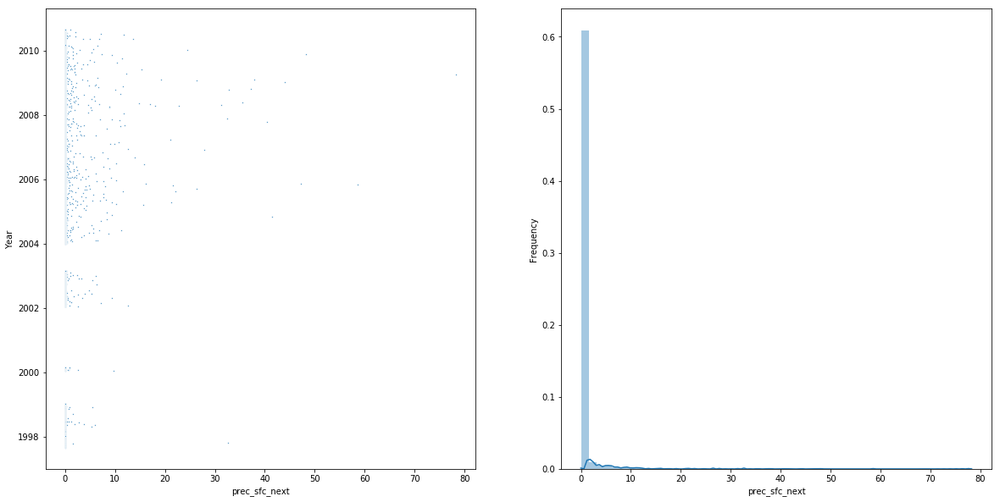

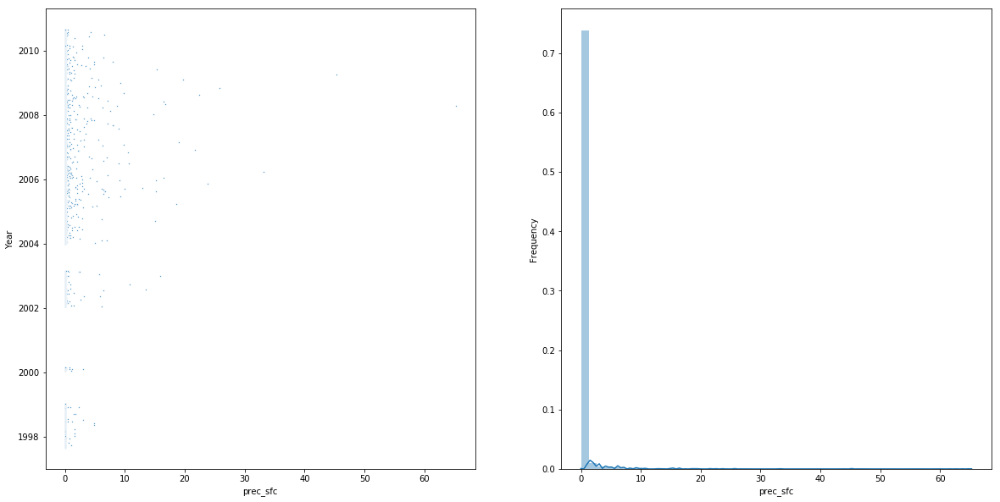

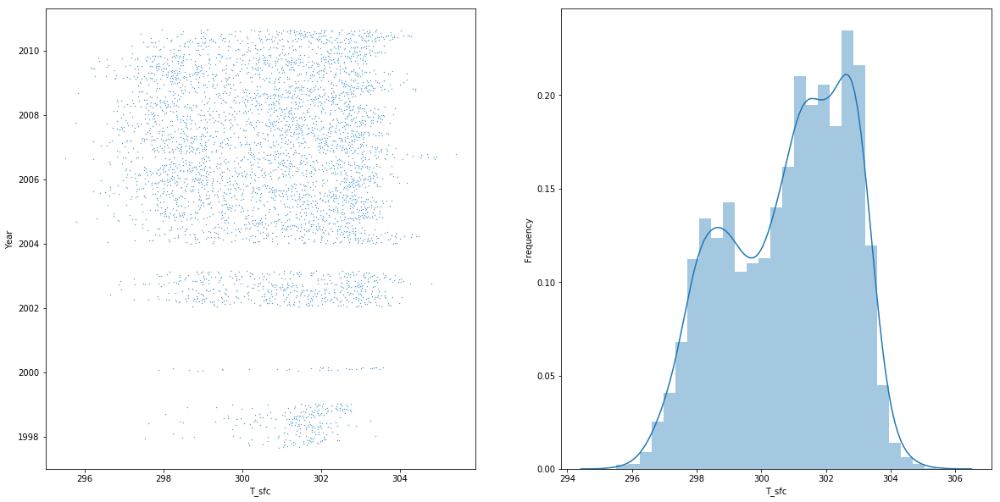

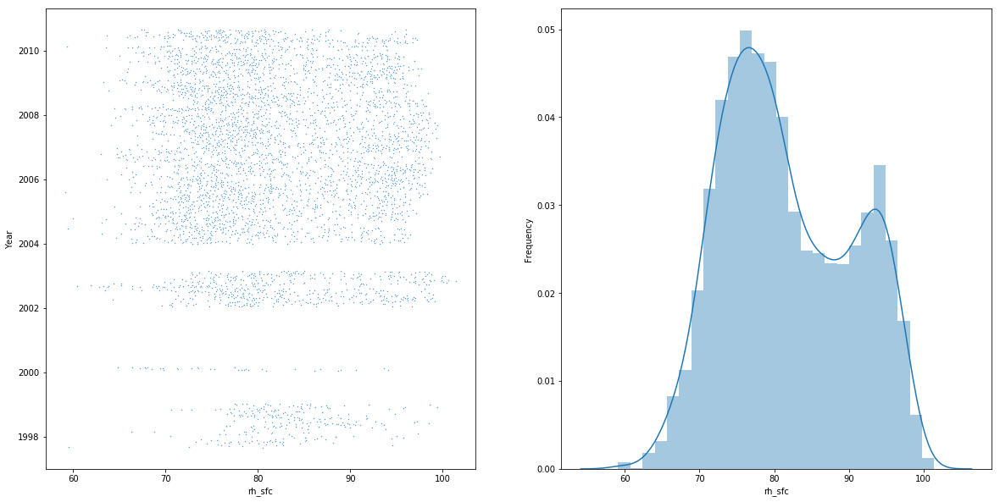

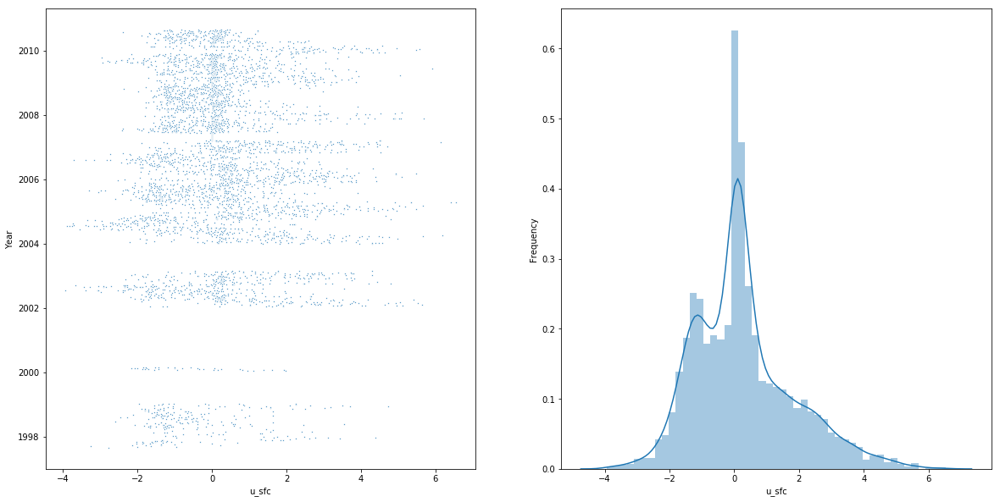

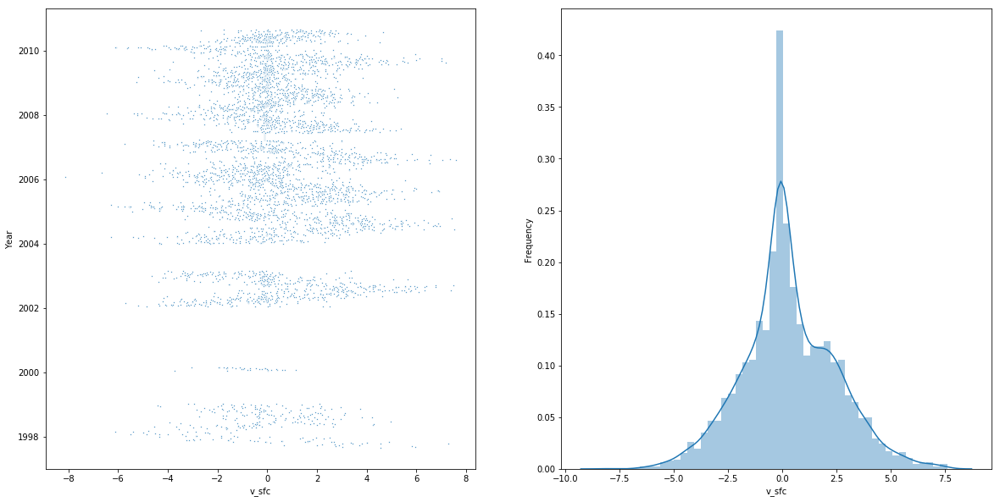

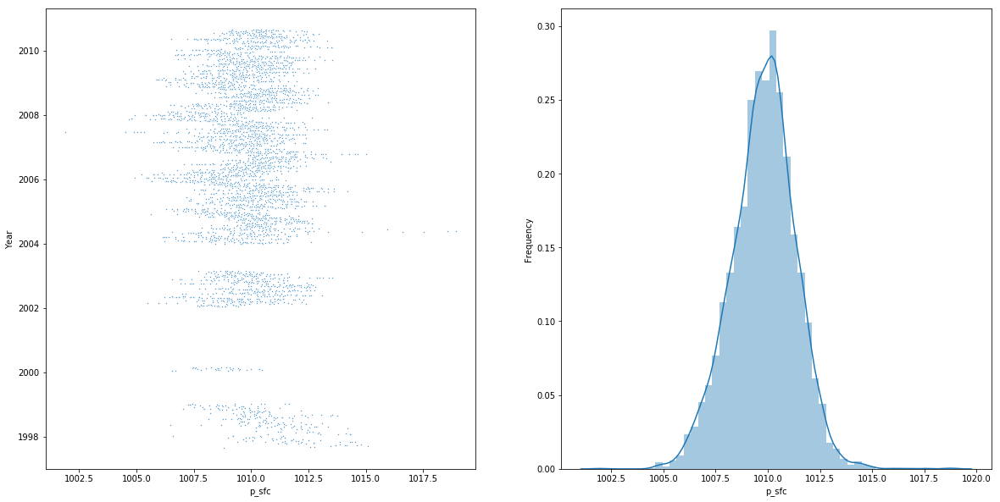

In [10]:
plot_1d(DS, var_1d)

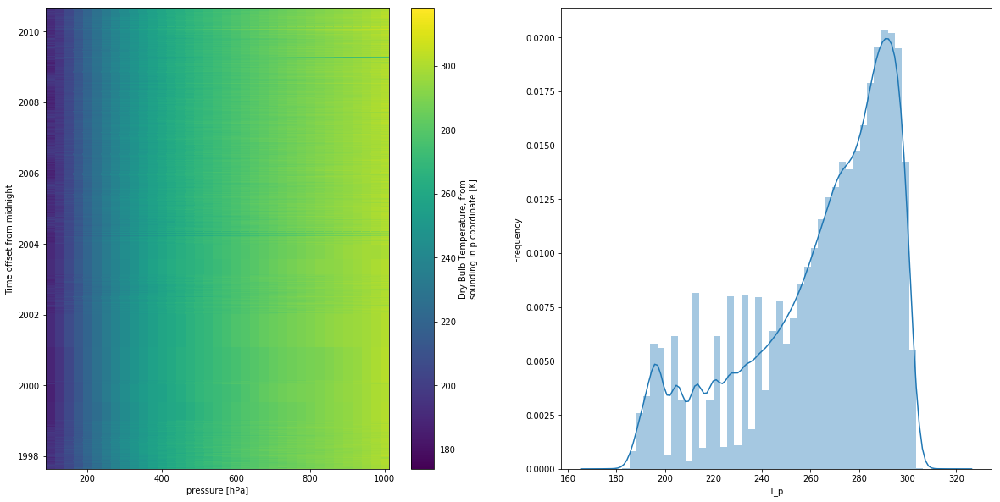

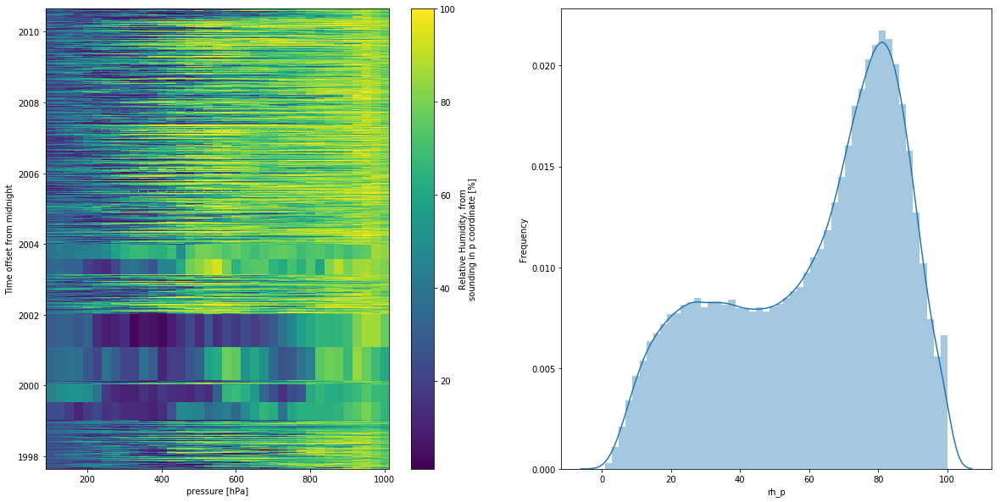

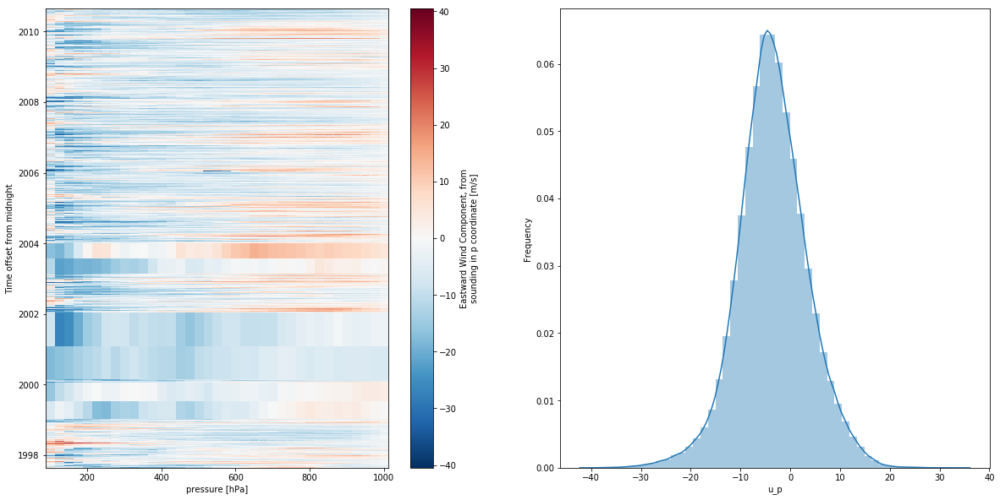

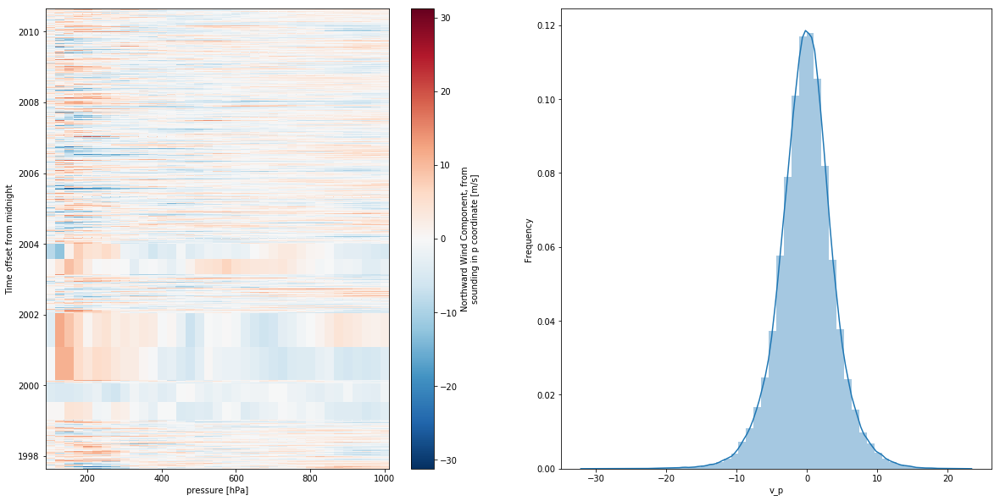

In [11]:
plot_2d(DS, var_2d)

### Correlation Plots

In [12]:
from utils import DS_flatten, plot_pair, plot_corr
DS_temp = DS_flatten(DS, var_1d, var_2d)
df = DS_temp.to_dataframe()

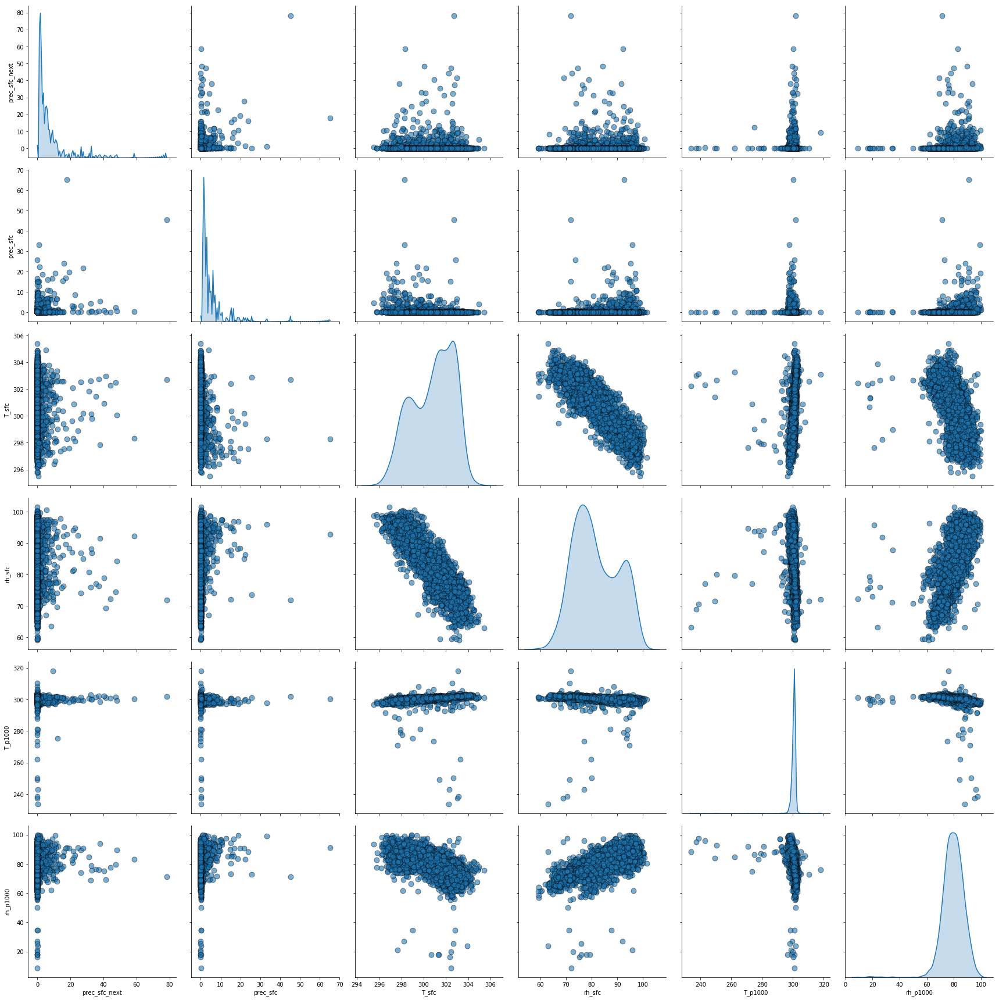

In [13]:
# Pair plot
plot_pair(df,
          cols_str=['prec_sfc_next', 'prec_sfc', 'T_sfc', 'rh_sfc', 'T_p1000', 'rh_p1000'])

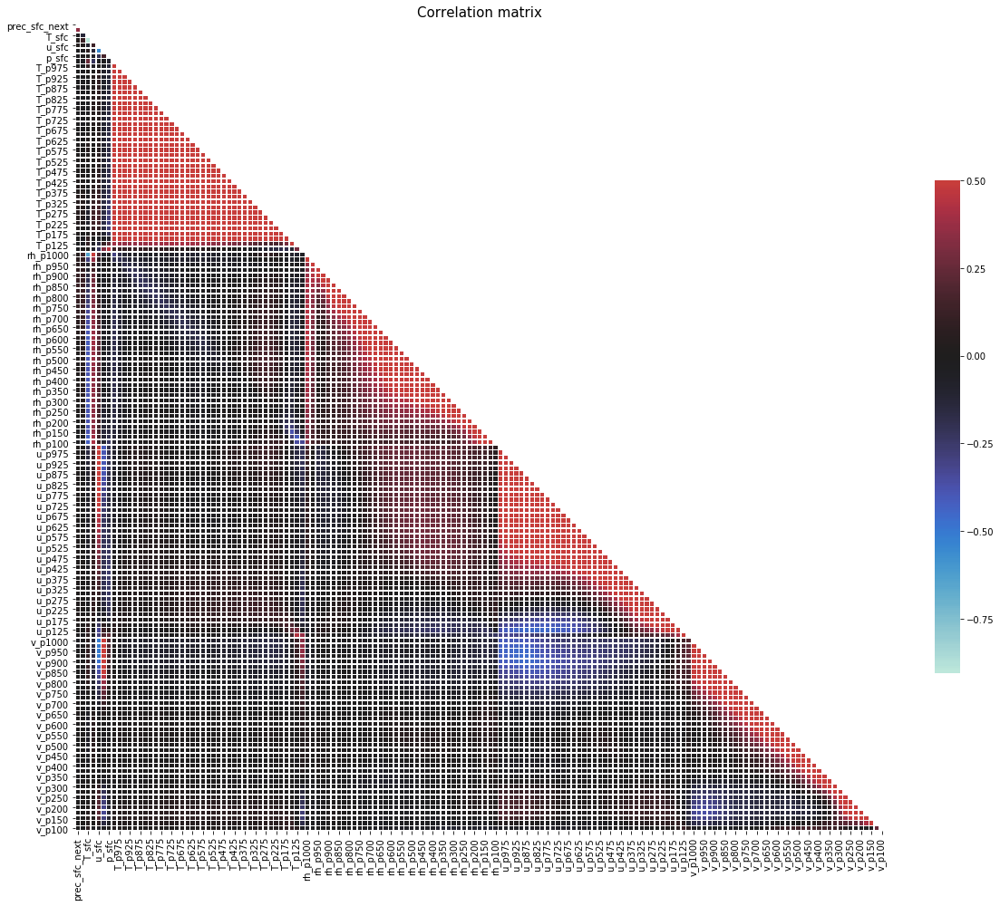

In [14]:
# Correlation Matrix
plot_corr(df)

### Flattened One-dimensional Parameter Plots

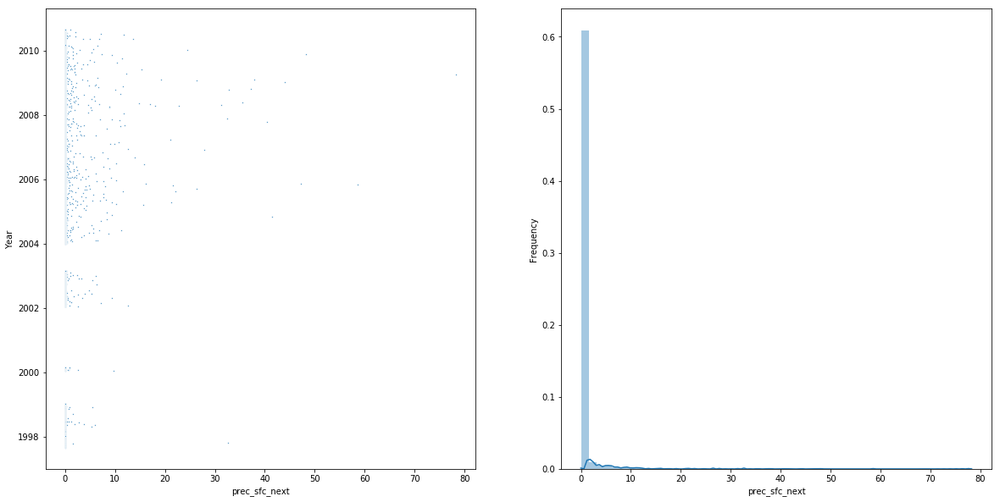

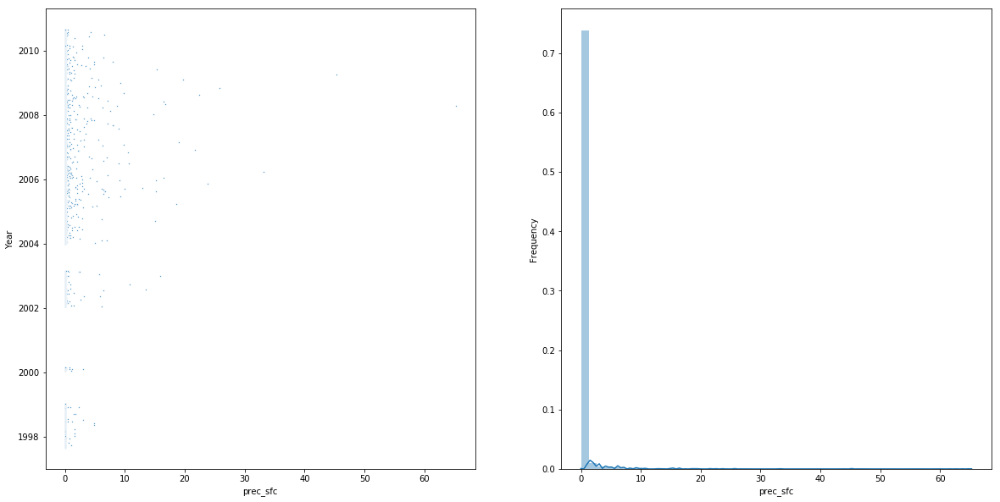

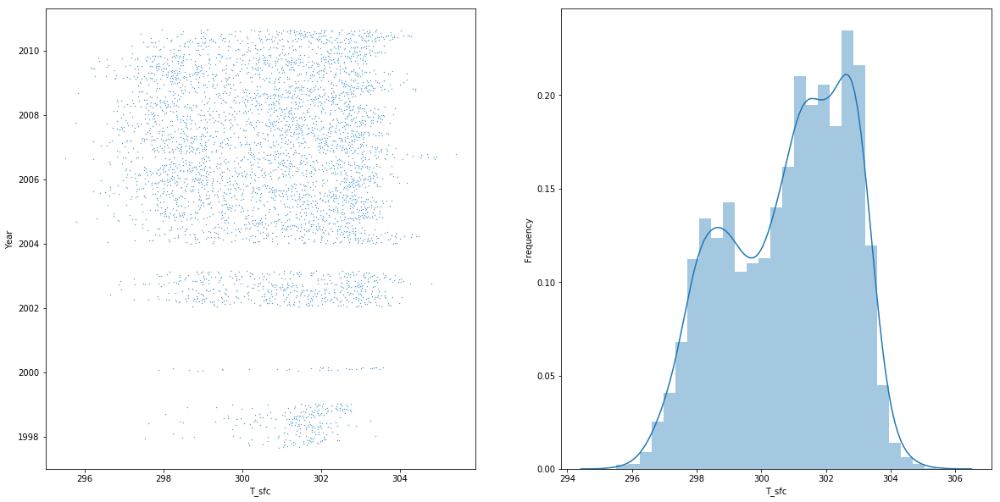

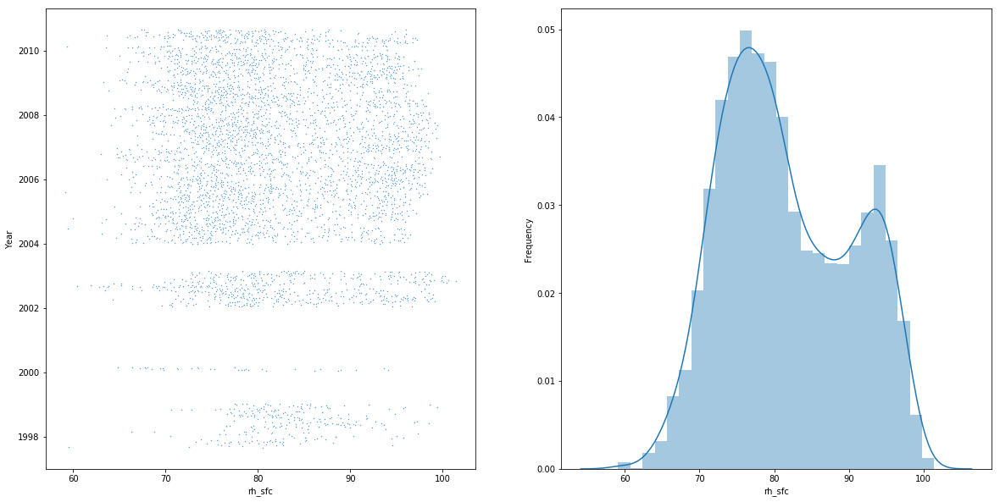

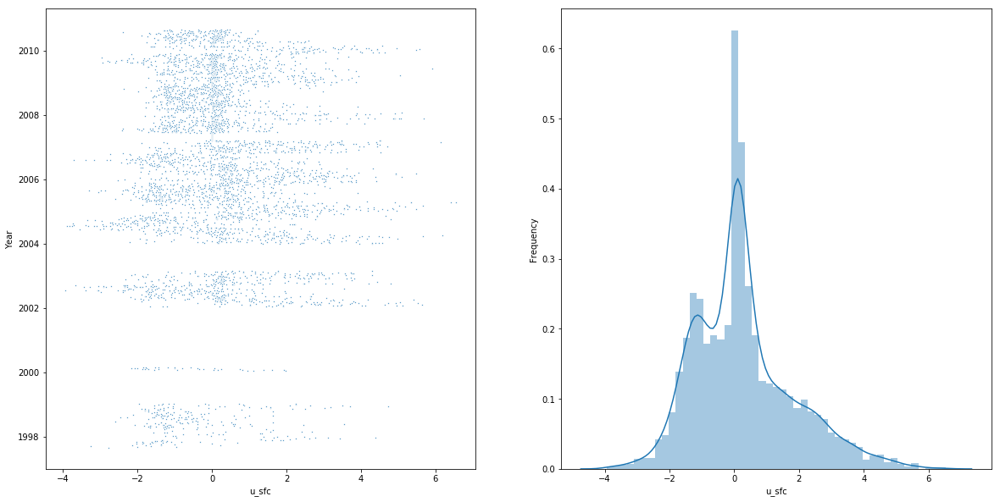

...

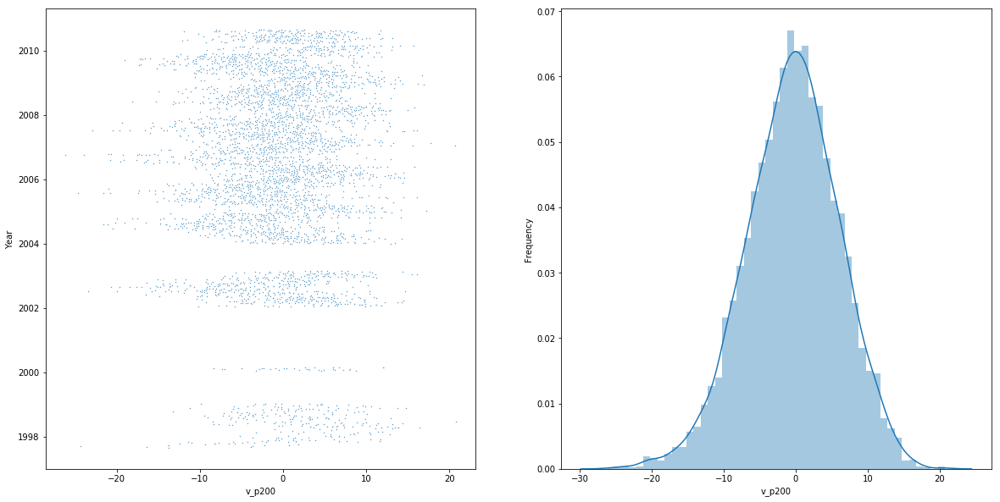

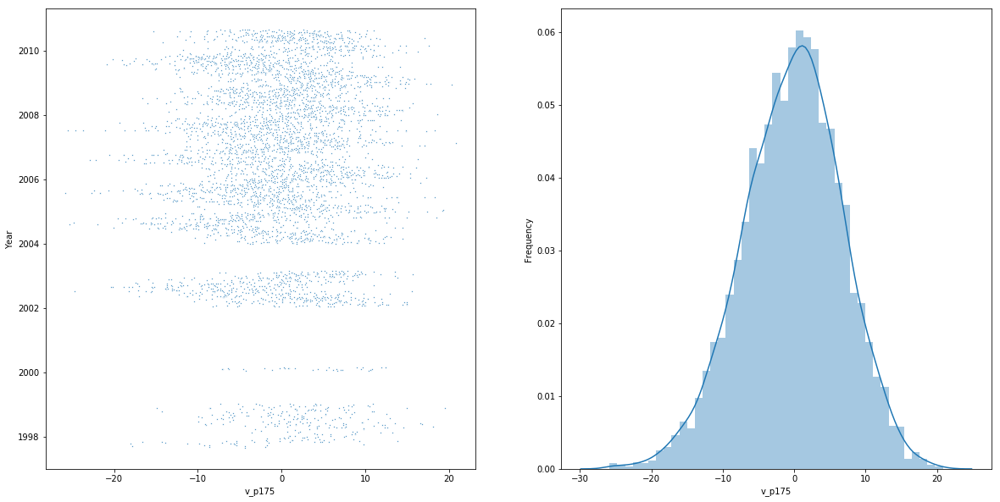

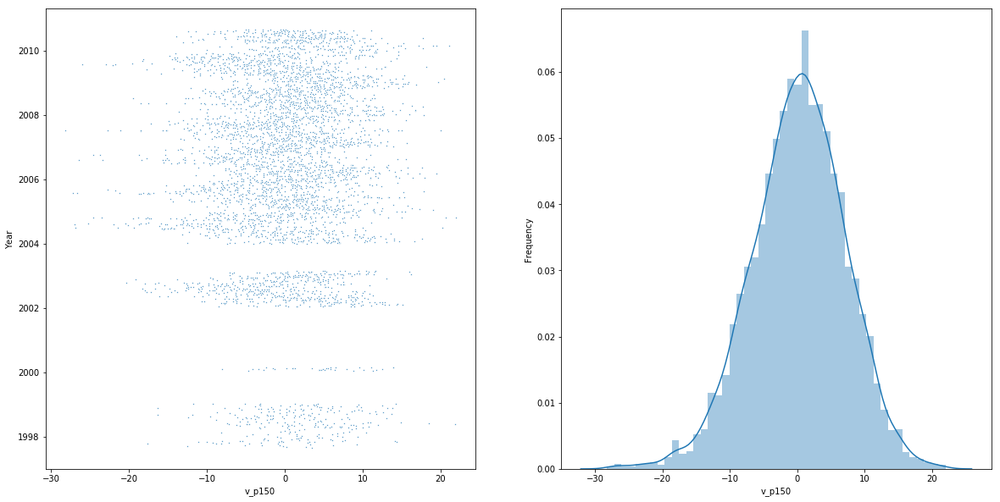

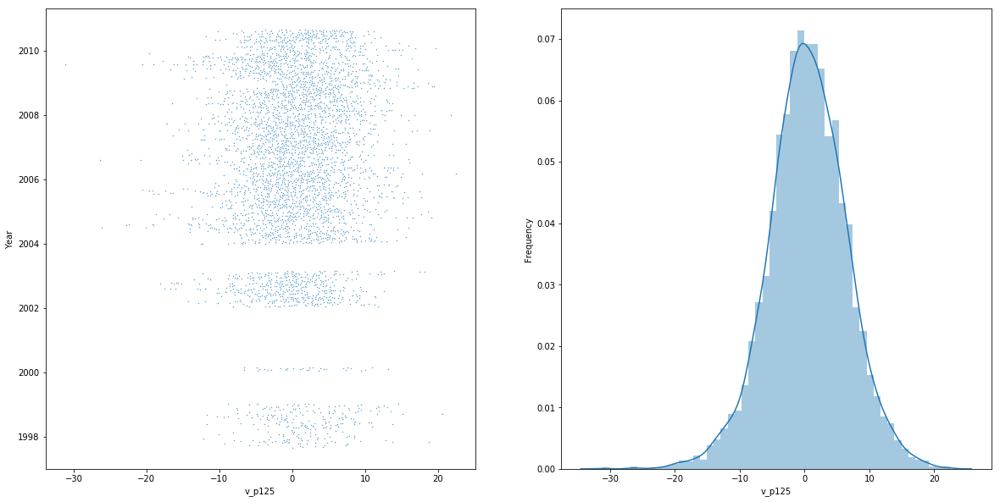

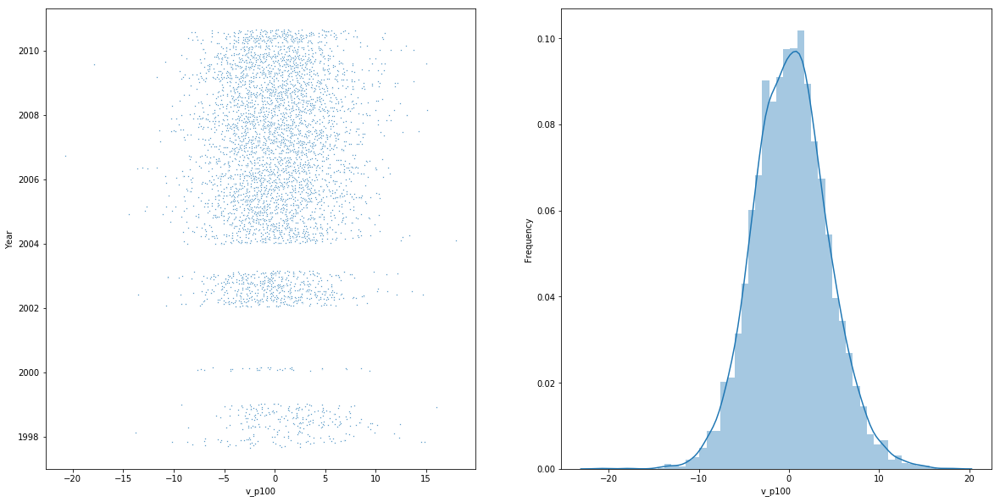

In [15]:
plot_1d(DS_temp, list(DS_temp))

## Data Filtering

# Data Pre-processing

## Data Loading

In [16]:
str_y = list(DS)[0]
str_Xscalar = [var for var in list(DS)[1:] if '_p' not in var]
str_Xvec = [var for var in list(DS)[1:] if '_p' in var]
#plev = DS['p'].values.astype(float)  # array of pressure level

In [17]:
from utils import extract_scalar, merge_channels

In [18]:
y, Xscalar = extract_scalar(DS, str_y, str_Xscalar)
print(y.shape)
print(Xscalar.shape)

(4807, 1)
(4807, 6)


In [19]:
Xvec = merge_channels(DS, str_Xvec)
print(Xvec.shape)

(4807, 37, 4)


## Train-test Split

In [20]:
def split(binary, y, Xscalar, Xvec, train_size=0.7, seed=seed):
    from sklearn.model_selection import train_test_split
    train_bin, test_bin, train_y, test_y, train_Xscalar, testX_scalar, train_Xvec, test_Xvec = train_test_split(binary, y, Xscalar, Xvec,
                                                                                                                            train_size=train_size,
                                                                                                                            random_state=seed,
                                                                                                                            shuffle=True,
                                                                                                                            stratify=binary)
    return train_bin, test_bin, train_y, test_y, train_Xscalar, testX_scalar, train_Xvec, test_Xvec

In [21]:
# Check class imbalance
binary = y > prec_threshold
print('1 class ratio= {:.2%}'.format(binary.mean()))

1 class ratio= 16.56%


In [22]:
# train-test split
train_bin, test_bin, train_y, test_y, train_Xscalar, test_Xscalar, train_Xvec, test_Xvec = split(binary, y, Xscalar, Xvec)

/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [23]:
# Class distribution in train and test samples
print('1 class ratio in train set= {:.2%}'.format(train_bin.mean()))
print('1 class ratio in test set= {:.2%}'.format(test_bin.mean()))

1 class ratio in train set= 16.56%
1 class ratio in test set= 16.56%


## Data Standardization

In [24]:
from utils import standardize, standardize_3d

In [25]:
# standardize
train_y, test_y, scaler_y = standardize(train_y, test_y)
train_Xscalar, test_Xscalar, scaler_Xscalar = standardize(train_Xscalar, test_Xscalar)
train_Xvec, test_Xvec, scalers_Xvec = standardize_3d(train_Xvec, test_Xvec)

## Data Flattening

In [26]:
from utils import flattening, unflattening

In [27]:
# flattening
train_Xflatten, train_Xboundary = flattening(train_Xscalar, train_Xvec)
test_Xflatten, test_Xboundary = flattening(test_Xscalar, test_Xvec)

## Data Grouping

In [28]:
# for convenience
from utils import all_x, all_y

if classification:
    all_data = (train_Xflatten, test_Xflatten, np.squeeze(train_bin), np.squeeze(test_bin))
else:
    all_data = (train_Xflatten, test_Xflatten, np.squeeze(train_y), np.squeeze(test_y))

# Classical Machine Learning Classification

## Model Objectification

In [23]:
'''
from sklearn.utils.class_weight import compute_class_weight
classes = [0,1]
class_w = compute_class_weight(class_weight='balanced', 
                               classes=classes, 
                               y=np.squeeze(train_bin))

class_w_dict = dict(zip(classes,class_w))
class_w_dict
'''

"\nfrom sklearn.utils.class_weight import compute_class_weight\nclasses = [0,1]\nclass_w = compute_class_weight(class_weight='balanced', \n                               classes=classes, \n                               y=np.squeeze(train_bin))\n\nclass_w_dict = dict(zip(classes,class_w))\nclass_w_dict\n"

In [77]:
class Classifier:
    def __init__(self, name, trained_classifier):
        self.name = name
        self.classifier = trained_classifier[0]
        self.f1_macro = trained_classifier[1]

## Common Classifiers

### K-nearest Neighbours

In [24]:
# WARNING - high-dim KNN is time-consuming

In [31]:
from utils_classifiers import KNN_grid_search

In [78]:
# KNN does not have class_weight implemented - make sense
knn = Classifier('KNN', KNN_grid_search(all_data))

KNN k=1: CV F1 macro= [0.5959] + [0.0146]
KNN k=2: CV F1 macro= [0.5483] + [0.0229]
KNN k=3: CV F1 macro= [0.5858] + [0.0172]
KNN k=4: CV F1 macro= [0.5367] + [0.0188]
KNN k=5: CV F1 macro= [0.5537] + [0.0160]
KNN k=6: CV F1 macro= [0.5256] + [0.0133]
KNN k=7: CV F1 macro= [0.5400] + [0.0135]
KNN k=8: CV F1 macro= [0.4978] + [0.0138]
KNN k=9: CV F1 macro= [0.5150] + [0.0169]
KNN k=10: CV F1 macro= [0.4989] + [0.0114]
              precision    recall  f1-score   support

       False       0.86      0.88      0.87      1204
        True       0.34      0.31      0.32       239

   micro avg       0.79      0.79      0.79      1443
   macro avg       0.60      0.59      0.60      1443
weighted avg       0.78      0.79      0.78      1443

[[1062  142]
 [ 166   73]]
AUROC= 0.5937
F1 macro= 0.5975

KNN k=1: F1 macro= 0.5975


### Logistic Regression

In [79]:
from utils_classifiers import LogReg_grid_search

In [80]:
logreg = Classifier('Logistic Regression', LogReg_grid_search(all_data))

L2 LogReg β=0.1: CV F1 macro= [0.5961] + [0.0151]
L2 LogReg β=0.2: CV F1 macro= [0.5964] + [0.0119]
L2 LogReg β=0.3: CV F1 macro= [0.5936] + [0.0141]
L2 LogReg β=0.4: CV F1 macro= [0.5934] + [0.0153]
L2 LogReg β=0.5: CV F1 macro= [0.5923] + [0.0148]
L2 LogReg β=0.6: CV F1 macro= [0.5926] + [0.0133]
L2 LogReg β=0.7: CV F1 macro= [0.5917] + [0.0136]
L2 LogReg β=0.8: CV F1 macro= [0.5917] + [0.0139]
L2 LogReg β=0.9: CV F1 macro= [0.5916] + [0.0146]
L2 LogReg β=1.0: CV F1 macro= [0.5921] + [0.0143]
L2 LogReg β=2.0: CV F1 macro= [0.5912] + [0.0170]
L2 LogReg β=3.0: CV F1 macro= [0.5910] + [0.0167]
L2 LogReg β=4.0: CV F1 macro= [0.5912] + [0.0169]
L2 LogReg β=5.0: CV F1 macro= [0.5909] + [0.0168]
L2 LogReg β=6.0: CV F1 macro= [0.5907] + [0.0166]
L2 LogReg β=7.0: CV F1 macro= [0.5907] + [0.0166]
L2 LogReg β=8.0: CV F1 macro= [0.5909] + [0.0165]
L2 LogReg β=9.0: CV F1 macro= [0.5905] + [0.0161]
L2 LogReg β=10.0: CV F1 macro= [0.5907] + [0.0162]
L1 LogReg β=0.1: CV F1 macro= [0.5999] + [0.0070]

/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


              precision    recall  f1-score   support

       False       0.90      0.74      0.81      1204
        True       0.30      0.57      0.39       239

   micro avg       0.71      0.71      0.71      1443
   macro avg       0.60      0.65      0.60      1443
weighted avg       0.80      0.71      0.74      1443

[[886 318]
 [102 137]]
AUROC= 0.6546
F1 macro= 0.6016

L1 LogReg β=0.2: F1 macro= 0.6016


### Support-vector Machine

In [81]:
from utils_classifiers import SVM_grid_search

In [82]:
svm = Classifier('SVM', SVM_grid_search(all_data))

SVM β=0.1: CV F1 macro= [0.5913] + [0.0020]
SVM β=0.2: CV F1 macro= [0.6128] + [0.0090]
SVM β=0.3: CV F1 macro= [0.6281] + [0.0127]
SVM β=0.4: CV F1 macro= [0.6375] + [0.0141]
SVM β=0.5: CV F1 macro= [0.6421] + [0.0089]
SVM β=0.6: CV F1 macro= [0.6459] + [0.0098]
SVM β=0.7: CV F1 macro= [0.6452] + [0.0102]
SVM β=0.8: CV F1 macro= [0.6447] + [0.0109]
SVM β=0.9: CV F1 macro= [0.6468] + [0.0117]
SVM β=1.0: CV F1 macro= [0.6459] + [0.0127]
SVM β=2.0: CV F1 macro= [0.6500] + [0.0120]
SVM β=3.0: CV F1 macro= [0.6536] + [0.0211]
SVM β=4.0: CV F1 macro= [0.6483] + [0.0177]
SVM β=5.0: CV F1 macro= [0.6427] + [0.0186]
SVM β=6.0: CV F1 macro= [0.6386] + [0.0162]
SVM β=7.0: CV F1 macro= [0.6345] + [0.0175]
SVM β=8.0: CV F1 macro= [0.6335] + [0.0160]
SVM β=9.0: CV F1 macro= [0.6346] + [0.0171]
SVM β=10.0: CV F1 macro= [0.6330] + [0.0178]
              precision    recall  f1-score   support

       False       0.88      0.87      0.88      1204
        True       0.37      0.38      0.38       239


## Tree-type Classifiers

### Random Forest

In [83]:
from utils_classifiers import RandomForest_grid_search

In [84]:
forest = Classifier('Random Forest', RandomForest_grid_search(all_data))

              precision    recall  f1-score   support

       False       0.92      0.82      0.87      1204
        True       0.41      0.64      0.50       239

   micro avg       0.79      0.79      0.79      1443
   macro avg       0.67      0.73      0.68      1443
weighted avg       0.84      0.79      0.81      1443

[[987 217]
 [ 87 152]]
AUROC= 0.7279
F1 macro= 0.6833
RandomForest depth=2: F1 macro= [0.6833]
              precision    recall  f1-score   support

       False       0.92      0.85      0.89      1204
        True       0.47      0.65      0.54       239

   micro avg       0.82      0.82      0.82      1443
   macro avg       0.70      0.75      0.72      1443
weighted avg       0.85      0.82      0.83      1443

[[1029  175]
 [  84  155]]
AUROC= 0.7516
F1 macro= 0.7165
RandomForest depth=3: F1 macro= [0.7165]
              precision    recall  f1-score   support

       False       0.92      0.88      0.90      1204
        True       0.52      0.64      0.57

### Bagging

In [85]:
from utils_classifiers import Bagging

In [86]:
# Bagging does not have class_weight implemented
bag = Classifier('Bagging', Bagging(all_data))

              precision    recall  f1-score   support

       False       0.92      0.96      0.94      1204
        True       0.74      0.61      0.67       239

   micro avg       0.90      0.90      0.90      1443
   macro avg       0.83      0.78      0.80      1443
weighted avg       0.89      0.90      0.90      1443

[[1154   50]
 [  94  145]]
AUROC= 0.7826
F1 macro= 0.8047


### Decision Tree

In [87]:
from utils_classifiers import DecisionTree

In [88]:
tree = Classifier('Decision Tree', DecisionTree(all_data))

              precision    recall  f1-score   support

       False       0.90      0.91      0.90      1204
        True       0.51      0.49      0.50       239

   micro avg       0.84      0.84      0.84      1443
   macro avg       0.71      0.70      0.70      1443
weighted avg       0.84      0.84      0.84      1443

[[1092  112]
 [ 122  117]]
AUROC= 0.6983
F1 macro= 0.7016


### Extra Trees

In [89]:
from utils_classifiers import ExtraTrees

In [90]:
extra = Classifier('Extra Trees', ExtraTrees(all_data))

              precision    recall  f1-score   support

       False       0.84      1.00      0.91      1204
        True       0.88      0.06      0.12       239

   micro avg       0.84      0.84      0.84      1443
   macro avg       0.86      0.53      0.52      1443
weighted avg       0.85      0.84      0.78      1443

[[1202    2]
 [ 224   15]]
AUROC= 0.5306
F1 macro= 0.5156


## Boosting Classifiers

### Gradient Boosting

In [91]:
from utils_classifiers import GradB

In [92]:
# GradB does not have class_weight implemented
gradb = Classifier('Gradient Boosting', GradB(all_data))

              precision    recall  f1-score   support

       False       0.91      0.96      0.94      1204
        True       0.74      0.53      0.62       239

   micro avg       0.89      0.89      0.89      1443
   macro avg       0.83      0.75      0.78      1443
weighted avg       0.88      0.89      0.88      1443

[[1159   45]
 [ 112  127]]
AUROC= 0.7470
F1 macro= 0.7773


### AdaBoost

In [93]:
from utils_classifiers import AdaB

In [94]:
# AdaB does not have class_weight implemented
adab = Classifier('AdaBoost', AdaB(all_data))

              precision    recall  f1-score   support

       False       0.90      0.95      0.92      1204
        True       0.63      0.47      0.54       239

   micro avg       0.87      0.87      0.87      1443
   macro avg       0.77      0.71      0.73      1443
weighted avg       0.86      0.87      0.86      1443

[[1139   65]
 [ 126  113]]
AUROC= 0.7094
F1 macro= 0.7323


### XGBoost

In [95]:
from utils_classifiers import XGB

In [96]:
# XGB does not have class_weight implemented
xgb = Classifier('XGBoost', XGB(all_data))

              precision    recall  f1-score   support

       False       0.91      0.96      0.94      1204
        True       0.74      0.52      0.61       239

   micro avg       0.89      0.89      0.89      1443
   macro avg       0.82      0.74      0.77      1443
weighted avg       0.88      0.89      0.88      1443

[[1159   45]
 [ 114  125]]
AUROC= 0.7428
F1 macro= 0.7735


## Bayesian Classifiers

### Naïve Bayes

In [97]:
from utils_classifiers import NBayes

In [98]:
# NBayes does not have class_weight implemented
bayes = Classifier('Naïve Bayes', NBayes(all_data))

              precision    recall  f1-score   support

       False       0.87      0.88      0.88      1204
        True       0.38      0.36      0.37       239

   micro avg       0.80      0.80      0.80      1443
   macro avg       0.62      0.62      0.62      1443
weighted avg       0.79      0.80      0.79      1443

[[1063  141]
 [ 154   85]]
AUROC= 0.6193
F1 macro= 0.6219


### Gaussian Process

In [99]:
from utils_classifiers import GP

In [100]:
# GP does not have class_weight implemented
gp = Classifier('Gaussian Process', GP(all_data))

              precision    recall  f1-score   support

       False       0.86      0.89      0.88      1204
        True       0.35      0.30      0.32       239

   micro avg       0.79      0.79      0.79      1443
   macro avg       0.61      0.59      0.60      1443
weighted avg       0.78      0.79      0.79      1443

[[1073  131]
 [ 168   71]]
AUROC= 0.5941
F1 macro= 0.5999


## Majority Voting

In [105]:
from utils_classifiers import Voting

In [104]:
models = [knn, logreg, svm, forest, bag,
          tree, extra, gradb, adab, xgb, bayes, gp]
model_summary = pd.DataFrame({'Model': [x.name for x in models],
                              'F1': [x.f1_macro for x in models]}).set_index('Model').sort_values('F1',
                                                                                                  ascending=False)
model_summary

,F1
Model,
Bagging,0.804738
Gradient Boosting,0.777285
Random Forest,0.775572
XGBoost,0.773528
AdaBoost,0.732304
Decision Tree,0.701613
SVM,0.626401
Naïve Bayes,0.621870
Logistic Regression,0.601603


In [108]:
voting = Classifier('Voting', Voting(all_data, 
                                     models=[x.classifier for x in models],
                                     model_name=[x.name for x in models], 
                                     weights=[x.f1_macro for x in models],
                                     how_to_vote='hard'))

              precision    recall  f1-score   support

       False       0.90      0.97      0.93      1204
        True       0.76      0.47      0.58       239

   micro avg       0.89      0.89      0.89      1443
   macro avg       0.83      0.72      0.76      1443
weighted avg       0.88      0.89      0.88      1443

[[1168   36]
 [ 127  112]]
AUROC= 0.7194
F1 macro= 0.7568


## Stacking

# Convolutional Neural Net

## ADASYN Oversampling

In [48]:
from imblearn.over_sampling import ADASYN

In [62]:
train_Xflatten, train_Xboundary = flattening(train_Xscalar, train_Xvec)

adasyn = ADASYN(random_state=seed, n_jobs=-1)
train_Xflatten, train_bin = adasyn.fit_sample(train_Xflatten, train_bin)

train_Xscalar, train_Xvec = unflattening(train_Xflatten, train_Xboundary)

/scratch/s1895566/miniconda/base/envs/venv/lib/python3.6/site-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [71]:
# class di
print('1 class ratio after ADASYN= {:.2%}'.format(train_bin.mean()))

1 class ratio after ADASYN= 49.90%


## Network Construction

In [64]:
from keras.models import Model
from keras.layers import Activation, BatchNormalization, Conv1D, Dense, Dropout, MaxPooling1D
from keras.layers import concatenate, Flatten, Input
from keras.optimizers import Adam
from keras.utils import plot_model
from keras import regularizers

Using TensorFlow backend.


In [65]:
# Diff between classification and regression
final_activation, loss_metric, show_metric, labels = [
    'sigmoid', 'binary_crossentropy', ['accuracy'], train_bin] if classification else ['relu', 'mean_squared_error', None, train_y]

In [66]:
# Input placeholders
input_conv = Input(shape=train_Xvec.shape[1:], name='column_input')
input_scalar = Input(shape=(train_Xscalar.shape[1],), name='surface_input')

# Hidden layers
conv_1 = Conv1D(32, kernel_size=8)(input_conv)
bn_1 = BatchNormalization()(conv_1)
pool_1 = MaxPooling1D(pool_size=2)(bn_1)
act_1 = Activation('relu')(pool_1)

conv_2 = Conv1D(16, kernel_size=4)(act_1)
bn_2 = BatchNormalization()(conv_2)
pool_2 = MaxPooling1D(pool_size=2)(bn_2)
act_2 = Activation('relu')(pool_2)

flatten_2 = Flatten()(act_2)

layer = concatenate([flatten_2, input_scalar])
#layer = Dense(4, activation='relu')(layer)

hid_3 = Dense(16,
              activation='relu')(layer)
hid_3 = Dropout(0.1)(hid_3)

output = Dense(1,
               kernel_regularizer=regularizers.l2(0.02),
               activation=final_activation,
               name='output')(hid_3)

# 1. Initialize
model = Model(inputs=[input_conv, input_scalar], outputs=output)
plot_model(model, show_shapes=True, to_file='model.png')
print(model.summary())

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
column_input (InputLayer)       (None, 37, 5)        0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 30, 32)       1312        column_input[0][0]               
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 30, 32)       128         conv1d_1[0][0]                   
__________________________________________________________________________________________________
max_pooling1d_1 (MaxPooling1D)  (None, 15, 32)       0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
activation

In [67]:
# 2. Compile
model.compile(optimizer=Adam(),
              loss=loss_metric,
              metrics=show_metric)

In [68]:
# 3. Impose class weight to 'balance'
#class_weight = {0: train_bin.mean(),1: (1-train_bin.mean())}

In [72]:
# 4. Train
model.fit([train_Xvec, train_Xscalar], labels,
          epochs=2000,
          verbose=2)

Epoch 1/2000
 - 23s - loss: 0.2612 - acc: 0.9016
Epoch 2/2000
 - 24s - loss: 0.2363 - acc: 0.9126
Epoch 3/2000
 - 23s - loss: 0.2214 - acc: 0.9186
Epoch 4/2000
 - 22s - loss: 0.2083 - acc: 0.9241
Epoch 5/2000
 - 23s - loss: 0.1974 - acc: 0.9291
Epoch 6/2000
 - 23s - loss: 0.1896 - acc: 0.9319
Epoch 7/2000
 - 24s - loss: 0.1824 - acc: 0.9353
Epoch 8/2000
 - 24s - loss: 0.1779 - acc: 0.9365
Epoch 9/2000
 - 23s - loss: 0.1708 - acc: 0.9398
Epoch 10/2000
 - 24s - loss: 0.1671 - acc: 0.9417
Epoch 11/2000
 - 23s - loss: 0.1651 - acc: 0.9422
Epoch 12/2000
 - 23s - loss: 0.1618 - acc: 0.9439
Epoch 13/2000
 - 23s - loss: 0.1571 - acc: 0.9458
Epoch 14/2000
 - 23s - loss: 0.1552 - acc: 0.9468
Epoch 15/2000
 - 24s - loss: 0.1515 - acc: 0.9479
Epoch 16/2000
 - 23s - loss: 0.1503 - acc: 0.9482
Epoch 17/2000
 - 23s - loss: 0.1468 - acc: 0.9499
Epoch 18/2000
 - 23s - loss: 0.1451 - acc: 0.9505
Epoch 19/2000
 - 23s - loss: 0.1425 - acc: 0.9520
Epoch 20/2000
 - 23s - loss: 0.1412 - acc: 0.9515
Epoch 21/

Epoch 164/2000
 - 22s - loss: 0.0834 - acc: 0.9736
Epoch 165/2000
 - 23s - loss: 0.0828 - acc: 0.9734
Epoch 166/2000
 - 22s - loss: 0.0829 - acc: 0.9737
Epoch 167/2000
 - 22s - loss: 0.0833 - acc: 0.9731
Epoch 168/2000
 - 23s - loss: 0.0826 - acc: 0.9736
Epoch 169/2000
 - 23s - loss: 0.0822 - acc: 0.9740
Epoch 170/2000
 - 23s - loss: 0.0825 - acc: 0.9739
Epoch 171/2000
 - 24s - loss: 0.0827 - acc: 0.9737
Epoch 172/2000
 - 25s - loss: 0.0819 - acc: 0.9744
Epoch 173/2000
 - 23s - loss: 0.0816 - acc: 0.9739
Epoch 174/2000
 - 23s - loss: 0.0810 - acc: 0.9745
Epoch 175/2000
 - 24s - loss: 0.0822 - acc: 0.9740
Epoch 176/2000
 - 23s - loss: 0.0827 - acc: 0.9740
Epoch 177/2000
 - 24s - loss: 0.0826 - acc: 0.9737
Epoch 178/2000
 - 23s - loss: 0.0822 - acc: 0.9741
Epoch 179/2000
 - 23s - loss: 0.0820 - acc: 0.9743
Epoch 180/2000
 - 22s - loss: 0.0812 - acc: 0.9745
Epoch 181/2000
 - 22s - loss: 0.0819 - acc: 0.9741
Epoch 182/2000
 - 22s - loss: 0.0821 - acc: 0.9740
Epoch 183/2000
 - 23s - loss: 0

Epoch 325/2000
 - 23s - loss: 0.0726 - acc: 0.9769
Epoch 326/2000
 - 23s - loss: 0.0725 - acc: 0.9772
Epoch 327/2000
 - 23s - loss: 0.0707 - acc: 0.9777
Epoch 328/2000
 - 24s - loss: 0.0720 - acc: 0.9772
Epoch 329/2000
 - 23s - loss: 0.0727 - acc: 0.9772
Epoch 330/2000
 - 23s - loss: 0.0723 - acc: 0.9774
Epoch 331/2000
 - 23s - loss: 0.0718 - acc: 0.9778
Epoch 332/2000
 - 23s - loss: 0.0720 - acc: 0.9778
Epoch 333/2000
 - 23s - loss: 0.0724 - acc: 0.9772
Epoch 334/2000
 - 23s - loss: 0.0714 - acc: 0.9778
Epoch 335/2000
 - 23s - loss: 0.0722 - acc: 0.9774
Epoch 336/2000
 - 23s - loss: 0.0722 - acc: 0.9775
Epoch 337/2000
 - 22s - loss: 0.0715 - acc: 0.9773
Epoch 338/2000
 - 22s - loss: 0.0717 - acc: 0.9771
Epoch 339/2000
 - 22s - loss: 0.0724 - acc: 0.9774
Epoch 340/2000
 - 22s - loss: 0.0736 - acc: 0.9767
Epoch 341/2000
 - 22s - loss: 0.0726 - acc: 0.9770
Epoch 342/2000
 - 23s - loss: 0.0721 - acc: 0.9772
Epoch 343/2000
 - 22s - loss: 0.0725 - acc: 0.9773
Epoch 344/2000
 - 22s - loss: 0

Epoch 486/2000
 - 23s - loss: 0.0676 - acc: 0.9787
Epoch 487/2000
 - 23s - loss: 0.0679 - acc: 0.9785
Epoch 488/2000
 - 22s - loss: 0.0666 - acc: 0.9791
Epoch 489/2000
 - 23s - loss: 0.0672 - acc: 0.9791
Epoch 490/2000
 - 23s - loss: 0.0674 - acc: 0.9787
Epoch 491/2000
 - 23s - loss: 0.0677 - acc: 0.9783
Epoch 492/2000
 - 23s - loss: 0.0676 - acc: 0.9788
Epoch 493/2000
 - 23s - loss: 0.0672 - acc: 0.9790
Epoch 494/2000
 - 24s - loss: 0.0665 - acc: 0.9790
Epoch 495/2000
 - 23s - loss: 0.0668 - acc: 0.9791
Epoch 496/2000
 - 23s - loss: 0.0675 - acc: 0.9790
Epoch 497/2000
 - 23s - loss: 0.0674 - acc: 0.9790
Epoch 498/2000
 - 23s - loss: 0.0683 - acc: 0.9784
Epoch 499/2000
 - 23s - loss: 0.0684 - acc: 0.9785
Epoch 500/2000
 - 22s - loss: 0.0661 - acc: 0.9794
Epoch 501/2000
 - 22s - loss: 0.0676 - acc: 0.9790
Epoch 502/2000
 - 22s - loss: 0.0671 - acc: 0.9791
Epoch 503/2000
 - 23s - loss: 0.0671 - acc: 0.9789
Epoch 504/2000
 - 23s - loss: 0.0675 - acc: 0.9785
Epoch 505/2000
 - 22s - loss: 0

Epoch 647/2000
 - 23s - loss: 0.0649 - acc: 0.9797
Epoch 648/2000
 - 23s - loss: 0.0637 - acc: 0.9800
Epoch 649/2000
 - 23s - loss: 0.0636 - acc: 0.9802
Epoch 650/2000
 - 23s - loss: 0.0654 - acc: 0.9794
Epoch 651/2000
 - 23s - loss: 0.0636 - acc: 0.9801
Epoch 652/2000
 - 23s - loss: 0.0654 - acc: 0.9795
Epoch 653/2000
 - 23s - loss: 0.0639 - acc: 0.9802
Epoch 654/2000
 - 23s - loss: 0.0647 - acc: 0.9797
Epoch 655/2000
 - 23s - loss: 0.0656 - acc: 0.9794
Epoch 656/2000
 - 22s - loss: 0.0643 - acc: 0.9798
Epoch 657/2000
 - 22s - loss: 0.0648 - acc: 0.9797
Epoch 658/2000
 - 22s - loss: 0.0648 - acc: 0.9798
Epoch 659/2000
 - 22s - loss: 0.0636 - acc: 0.9799
Epoch 660/2000
 - 23s - loss: 0.0639 - acc: 0.9800
Epoch 661/2000
 - 23s - loss: 0.0636 - acc: 0.9800
Epoch 662/2000
 - 22s - loss: 0.0636 - acc: 0.9799
Epoch 663/2000
 - 22s - loss: 0.0653 - acc: 0.9793
Epoch 664/2000
 - 22s - loss: 0.0635 - acc: 0.9802
Epoch 665/2000
 - 23s - loss: 0.0637 - acc: 0.9799
Epoch 666/2000
 - 23s - loss: 0

Epoch 808/2000
 - 23s - loss: 0.0627 - acc: 0.9807
Epoch 809/2000
 - 23s - loss: 0.0624 - acc: 0.9807
Epoch 810/2000
 - 22s - loss: 0.0630 - acc: 0.9803
Epoch 811/2000
 - 24s - loss: 0.0619 - acc: 0.9810
Epoch 812/2000
 - 24s - loss: 0.0617 - acc: 0.9809
Epoch 813/2000
 - 23s - loss: 0.0610 - acc: 0.9811
Epoch 814/2000
 - 23s - loss: 0.0625 - acc: 0.9803
Epoch 815/2000
 - 23s - loss: 0.0618 - acc: 0.9807
Epoch 816/2000
 - 23s - loss: 0.0615 - acc: 0.9809
Epoch 817/2000
 - 23s - loss: 0.0622 - acc: 0.9808
Epoch 818/2000
 - 22s - loss: 0.0615 - acc: 0.9809
Epoch 819/2000
 - 24s - loss: 0.0625 - acc: 0.9805
Epoch 820/2000
 - 23s - loss: 0.0625 - acc: 0.9806
Epoch 821/2000
 - 24s - loss: 0.0626 - acc: 0.9808
Epoch 822/2000
 - 23s - loss: 0.0631 - acc: 0.9807
Epoch 823/2000
 - 23s - loss: 0.0621 - acc: 0.9805
Epoch 824/2000
 - 23s - loss: 0.0606 - acc: 0.9808
Epoch 825/2000
 - 23s - loss: 0.0617 - acc: 0.9809
Epoch 826/2000
 - 23s - loss: 0.0624 - acc: 0.9809
Epoch 827/2000
 - 23s - loss: 0

Epoch 969/2000
 - 23s - loss: 0.0602 - acc: 0.9817
Epoch 970/2000
 - 23s - loss: 0.0607 - acc: 0.9811
Epoch 971/2000
 - 23s - loss: 0.0605 - acc: 0.9814
Epoch 972/2000
 - 23s - loss: 0.0614 - acc: 0.9808
Epoch 973/2000
 - 22s - loss: 0.0606 - acc: 0.9813
Epoch 974/2000
 - 22s - loss: 0.0598 - acc: 0.9817
Epoch 975/2000
 - 22s - loss: 0.0598 - acc: 0.9816
Epoch 976/2000
 - 22s - loss: 0.0601 - acc: 0.9814
Epoch 977/2000
 - 22s - loss: 0.0591 - acc: 0.9815
Epoch 978/2000
 - 22s - loss: 0.0614 - acc: 0.9814
Epoch 979/2000
 - 22s - loss: 0.0607 - acc: 0.9811
Epoch 980/2000
 - 23s - loss: 0.0611 - acc: 0.9813
Epoch 981/2000
 - 23s - loss: 0.0613 - acc: 0.9810
Epoch 982/2000
 - 22s - loss: 0.0602 - acc: 0.9815
Epoch 983/2000
 - 23s - loss: 0.0604 - acc: 0.9812
Epoch 984/2000
 - 23s - loss: 0.0591 - acc: 0.9814
Epoch 985/2000
 - 23s - loss: 0.0590 - acc: 0.9818
Epoch 986/2000
 - 23s - loss: 0.0592 - acc: 0.9818
Epoch 987/2000
 - 23s - loss: 0.0599 - acc: 0.9814
Epoch 988/2000
 - 23s - loss: 0

 - 22s - loss: 0.0592 - acc: 0.9815
Epoch 1128/2000
 - 22s - loss: 0.0590 - acc: 0.9818
Epoch 1129/2000
 - 22s - loss: 0.0593 - acc: 0.9816
Epoch 1130/2000
 - 25s - loss: 0.0598 - acc: 0.9816
Epoch 1131/2000
 - 23s - loss: 0.0596 - acc: 0.9817
Epoch 1132/2000
 - 23s - loss: 0.0596 - acc: 0.9813
Epoch 1133/2000
 - 22s - loss: 0.0594 - acc: 0.9817
Epoch 1134/2000
 - 22s - loss: 0.0590 - acc: 0.9812
Epoch 1135/2000
 - 22s - loss: 0.0586 - acc: 0.9819
Epoch 1136/2000
 - 23s - loss: 0.0587 - acc: 0.9818
Epoch 1137/2000
 - 22s - loss: 0.0590 - acc: 0.9817
Epoch 1138/2000
 - 23s - loss: 0.0586 - acc: 0.9821
Epoch 1139/2000
 - 23s - loss: 0.0589 - acc: 0.9816
Epoch 1140/2000
 - 23s - loss: 0.0594 - acc: 0.9815
Epoch 1141/2000
 - 23s - loss: 0.0590 - acc: 0.9816
Epoch 1142/2000
 - 23s - loss: 0.0587 - acc: 0.9818
Epoch 1143/2000
 - 23s - loss: 0.0595 - acc: 0.9811
Epoch 1144/2000
 - 24s - loss: 0.0583 - acc: 0.9818
Epoch 1145/2000
 - 22s - loss: 0.0595 - acc: 0.9815
Epoch 1146/2000
 - 23s - los

Epoch 1285/2000
 - 22s - loss: 0.0576 - acc: 0.9819
Epoch 1286/2000
 - 22s - loss: 0.0586 - acc: 0.9818
Epoch 1287/2000
 - 23s - loss: 0.0574 - acc: 0.9822
Epoch 1288/2000
 - 22s - loss: 0.0579 - acc: 0.9821
Epoch 1289/2000
 - 22s - loss: 0.0586 - acc: 0.9817
Epoch 1290/2000
 - 22s - loss: 0.0589 - acc: 0.9821
Epoch 1291/2000
 - 23s - loss: 0.0584 - acc: 0.9819
Epoch 1292/2000
 - 22s - loss: 0.0568 - acc: 0.9824
Epoch 1293/2000
 - 23s - loss: 0.0588 - acc: 0.9814
Epoch 1294/2000
 - 22s - loss: 0.0578 - acc: 0.9821
Epoch 1295/2000
 - 22s - loss: 0.0586 - acc: 0.9819
Epoch 1296/2000
 - 22s - loss: 0.0573 - acc: 0.9822
Epoch 1297/2000
 - 23s - loss: 0.0572 - acc: 0.9826
Epoch 1298/2000
 - 23s - loss: 0.0575 - acc: 0.9822
Epoch 1299/2000
 - 23s - loss: 0.0586 - acc: 0.9817
Epoch 1300/2000
 - 25s - loss: 0.0582 - acc: 0.9819
Epoch 1301/2000
 - 24s - loss: 0.0574 - acc: 0.9822
Epoch 1302/2000
 - 24s - loss: 0.0576 - acc: 0.9823
Epoch 1303/2000
 - 23s - loss: 0.0589 - acc: 0.9820
Epoch 1304/2

Epoch 1443/2000
 - 23s - loss: 0.0571 - acc: 0.9824
Epoch 1444/2000
 - 23s - loss: 0.0580 - acc: 0.9817
Epoch 1445/2000
 - 22s - loss: 0.0569 - acc: 0.9824
Epoch 1446/2000
 - 22s - loss: 0.0574 - acc: 0.9821
Epoch 1447/2000
 - 22s - loss: 0.0568 - acc: 0.9823
Epoch 1448/2000
 - 23s - loss: 0.0569 - acc: 0.9829
Epoch 1449/2000
 - 23s - loss: 0.0571 - acc: 0.9826
Epoch 1450/2000
 - 23s - loss: 0.0568 - acc: 0.9825
Epoch 1451/2000
 - 23s - loss: 0.0572 - acc: 0.9827
Epoch 1452/2000
 - 23s - loss: 0.0584 - acc: 0.9820
Epoch 1453/2000
 - 23s - loss: 0.0577 - acc: 0.9818
Epoch 1454/2000
 - 23s - loss: 0.0562 - acc: 0.9827
Epoch 1455/2000
 - 23s - loss: 0.0566 - acc: 0.9828
Epoch 1456/2000
 - 23s - loss: 0.0561 - acc: 0.9826
Epoch 1457/2000
 - 23s - loss: 0.0568 - acc: 0.9825
Epoch 1458/2000
 - 23s - loss: 0.0560 - acc: 0.9831
Epoch 1459/2000
 - 22s - loss: 0.0562 - acc: 0.9825
Epoch 1460/2000
 - 23s - loss: 0.0573 - acc: 0.9824
Epoch 1461/2000
 - 23s - loss: 0.0559 - acc: 0.9822
Epoch 1462/2

Epoch 1601/2000
 - 22s - loss: 0.0562 - acc: 0.9830
Epoch 1602/2000
 - 22s - loss: 0.0568 - acc: 0.9826
Epoch 1603/2000
 - 22s - loss: 0.0561 - acc: 0.9826
Epoch 1604/2000
 - 22s - loss: 0.0566 - acc: 0.9821
Epoch 1605/2000
 - 22s - loss: 0.0557 - acc: 0.9827
Epoch 1606/2000
 - 22s - loss: 0.0562 - acc: 0.9826
Epoch 1607/2000
 - 23s - loss: 0.0554 - acc: 0.9832
Epoch 1608/2000
 - 23s - loss: 0.0559 - acc: 0.9831
Epoch 1609/2000
 - 22s - loss: 0.0562 - acc: 0.9827
Epoch 1610/2000
 - 22s - loss: 0.0558 - acc: 0.9829
Epoch 1611/2000
 - 23s - loss: 0.0571 - acc: 0.9823
Epoch 1612/2000
 - 22s - loss: 0.0559 - acc: 0.9826
Epoch 1613/2000
 - 23s - loss: 0.0567 - acc: 0.9824
Epoch 1614/2000
 - 22s - loss: 0.0572 - acc: 0.9825
Epoch 1615/2000
 - 23s - loss: 0.0560 - acc: 0.9824
Epoch 1616/2000
 - 22s - loss: 0.0572 - acc: 0.9820
Epoch 1617/2000
 - 22s - loss: 0.0562 - acc: 0.9826
Epoch 1618/2000
 - 22s - loss: 0.0552 - acc: 0.9830
Epoch 1619/2000
 - 23s - loss: 0.0553 - acc: 0.9829
Epoch 1620/2

Epoch 1759/2000
 - 22s - loss: 0.0554 - acc: 0.9830
Epoch 1760/2000
 - 22s - loss: 0.0561 - acc: 0.9826
Epoch 1761/2000
 - 22s - loss: 0.0553 - acc: 0.9830
Epoch 1762/2000
 - 22s - loss: 0.0568 - acc: 0.9824
Epoch 1763/2000
 - 22s - loss: 0.0565 - acc: 0.9826
Epoch 1764/2000
 - 22s - loss: 0.0561 - acc: 0.9824
Epoch 1765/2000
 - 23s - loss: 0.0549 - acc: 0.9829
Epoch 1766/2000
 - 23s - loss: 0.0565 - acc: 0.9826
Epoch 1767/2000
 - 23s - loss: 0.0562 - acc: 0.9827
Epoch 1768/2000
 - 22s - loss: 0.0555 - acc: 0.9826
Epoch 1769/2000
 - 23s - loss: 0.0544 - acc: 0.9831
Epoch 1770/2000
 - 23s - loss: 0.0553 - acc: 0.9832
Epoch 1771/2000
 - 22s - loss: 0.0551 - acc: 0.9831
Epoch 1772/2000
 - 23s - loss: 0.0553 - acc: 0.9829
Epoch 1773/2000
 - 22s - loss: 0.0563 - acc: 0.9825
Epoch 1774/2000
 - 24s - loss: 0.0549 - acc: 0.9828
Epoch 1775/2000
 - 23s - loss: 0.0558 - acc: 0.9833
Epoch 1776/2000
 - 24s - loss: 0.0554 - acc: 0.9827
Epoch 1777/2000
 - 23s - loss: 0.0547 - acc: 0.9831
Epoch 1778/2

Epoch 1917/2000
 - 23s - loss: 0.0559 - acc: 0.9826
Epoch 1918/2000
 - 22s - loss: 0.0546 - acc: 0.9832
Epoch 1919/2000
 - 22s - loss: 0.0558 - acc: 0.9825
Epoch 1920/2000
 - 22s - loss: 0.0537 - acc: 0.9835
Epoch 1921/2000
 - 22s - loss: 0.0552 - acc: 0.9828
Epoch 1922/2000
 - 22s - loss: 0.0543 - acc: 0.9832
Epoch 1923/2000
 - 22s - loss: 0.0536 - acc: 0.9837
Epoch 1924/2000
 - 23s - loss: 0.0554 - acc: 0.9830
Epoch 1925/2000
 - 22s - loss: 0.0555 - acc: 0.9830
Epoch 1926/2000
 - 22s - loss: 0.0552 - acc: 0.9830
Epoch 1927/2000
 - 22s - loss: 0.0551 - acc: 0.9832
Epoch 1928/2000
 - 22s - loss: 0.0558 - acc: 0.9828
Epoch 1929/2000
 - 22s - loss: 0.0544 - acc: 0.9833
Epoch 1930/2000
 - 23s - loss: 0.0549 - acc: 0.9831
Epoch 1931/2000
 - 23s - loss: 0.0542 - acc: 0.9833
Epoch 1932/2000
 - 23s - loss: 0.0547 - acc: 0.9831
Epoch 1933/2000
 - 23s - loss: 0.0562 - acc: 0.9828
Epoch 1934/2000
 - 23s - loss: 0.0559 - acc: 0.9827
Epoch 1935/2000
 - 23s - loss: 0.0551 - acc: 0.9835
Epoch 1936/2

## Testing

In [73]:
if classification:
    from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
    proba_bin_hat = model.predict([test_Xvec, test_Xscalar])
    test_bin_hat = proba_bin_hat >= 0.5
    
    print(accuracy_score(test_bin, test_bin_hat))
    print(classification_report(test_bin, test_bin_hat))
    print(confusion_matrix(test_bin, test_bin_hat))

0.8894915254237288
              precision    recall  f1-score   support

       False       0.98      0.90      0.94     26877
        True       0.22      0.68      0.33      1148

   micro avg       0.89      0.89      0.89     28025
   macro avg       0.60      0.79      0.64     28025
weighted avg       0.95      0.89      0.91     28025

[[24149  2728]
 [  369   779]]


In [74]:
if classification:
    score, acc = model.evaluate([test_Xvec, test_Xscalar], test_bin)
    print('Test score:', score)
    print('Test accuracy:', acc)

28025/28025 [==============================] - 2s 57us/step
Test score: 0.4794073496733682
Test accuracy: 0.8894915254386166
